In [1]:
from src.data.data import *
from src.orcml import *
from src.plotting import *
from src.utils.graph_utils import *
from src.isorc import *
from src.utils.embeddings import *
from sklearn.manifold import TSNE
import umap
%load_ext autoreload

exp_params = {
    'mode': 'nbrs',
    'n_neighbors': 15,
    'epsilon': None,
    'lda': 0.01,
    'delta': 0.8
}

In [2]:
%autoreload 2
# quadratics
n_points = 3000
noise = 0.175
noise_thresh = 0.4

return_dict = quadratics(n_points=n_points, noise=noise, noise_thresh=noise_thresh, supersample=True, n_clusters=3)

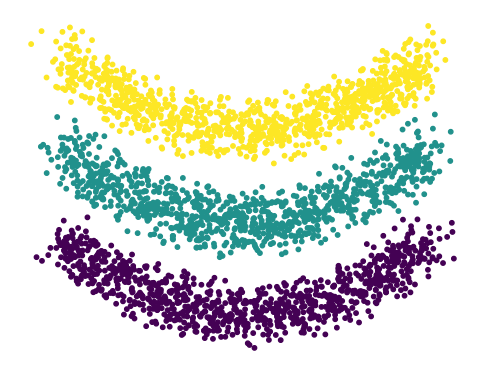

In [3]:
plot_data_2D(return_dict['data'], title=None, color=return_dict['cluster'], cmap='viridis')

In [55]:
# given a clustering, I want to compute the pairwise hausdorff distance between each cluster
n_clusters = len(np.unique(return_dict['cluster']))
print(f"Number of clusters: {n_clusters}")

from scipy.spatial.distance import directed_hausdorff

hausdorff_matrix = np.zeros((n_clusters, n_clusters))
for i in range(n_clusters):
    for j in range(n_clusters):
        if i != j:
            cluster_i = return_dict['data'][return_dict['cluster'] == i]
            cluster_j = return_dict['data'][return_dict['cluster'] == j]
            h_ij = directed_hausdorff(cluster_i, cluster_j)[0]
            h_ji = directed_hausdorff(cluster_j, cluster_i)[0]
            print(f"Cluster {i} vs Cluster {j}: {h_ij} vs {h_ji}")
            hausdorff_matrix[i, j] = max(h_ij, h_ji) # undirected

print(hausdorff_matrix)

Number of clusters: 3
Cluster 0 vs Cluster 1: 1.0751656154929075 vs 1.0060941554821443
Cluster 0 vs Cluster 2: 2.011761701649385 vs 2.063423396676528
Cluster 1 vs Cluster 0: 1.0060941554821443 vs 1.0751656154929075
Cluster 1 vs Cluster 2: 1.0350212778770067 vs 1.171143018899465
Cluster 2 vs Cluster 0: 2.063423396676528 vs 2.011761701649385
Cluster 2 vs Cluster 1: 1.171143018899465 vs 1.0350212778770067
[[0.         1.07516562 2.0634234 ]
 [1.07516562 0.         1.17114302]
 [2.0634234  1.17114302 0.        ]]


In [5]:
orcmanl = ORCManL(
    exp_params=exp_params,
    verbose=True,
    reattach=True
)
orcmanl.fit(return_dict['data'])

Number of candidate edges: 4447, Number of edges in G': 26905
Shortcut Edge Detected: edge 172
 d_G'(x,y)/effective_eps: 37.86750020679912
 Threshold/effective_eps: 9.97239158264089


Shortcut Edge Detected: edge 173
 d_G'(x,y)/effective_eps: 36.875904960125325
 Threshold/effective_eps: 9.97239158264089


Shortcut Edge Detected: edge 176
 d_G'(x,y)/effective_eps: 30.753694569637066
 Threshold/effective_eps: 9.97239158264089


Shortcut Edge Detected: edge 177
 d_G'(x,y)/effective_eps: 30.122320362860904
 Threshold/effective_eps: 9.97239158264089


Shortcut Edge Detected: edge 178
 d_G'(x,y)/effective_eps: 30.386914694282513
 Threshold/effective_eps: 9.97239158264089


Shortcut Edge Detected: edge 179
 d_G'(x,y)/effective_eps: 30.68198881157871
 Threshold/effective_eps: 9.97239158264089


Shortcut Edge Detected: edge 180
 d_G'(x,y)/effective_eps: 30.484367267343387
 Threshold/effective_eps: 9.97239158264089


Shortcut Edge Detected: edge 181
 d_G'(x,y)/effective_eps: 43.884294960096895
 

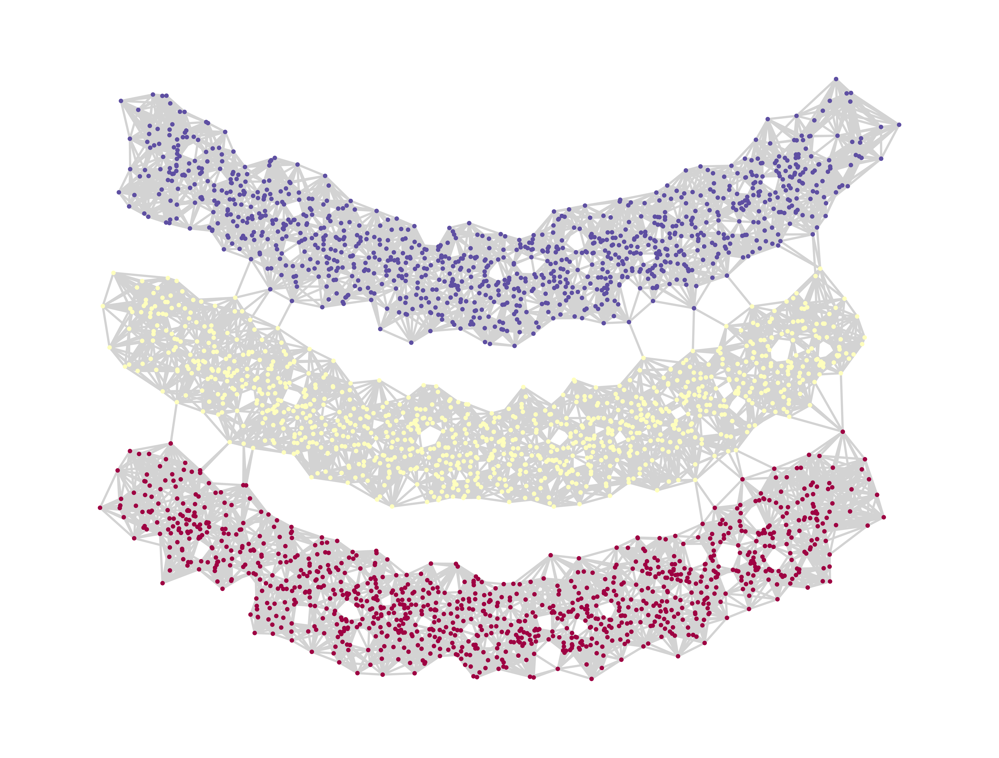

In [70]:
plot_graph_2D(return_dict['data'], orcmanl.G, node_color=return_dict['cluster'][orcmanl.G.nodes()], title=None)

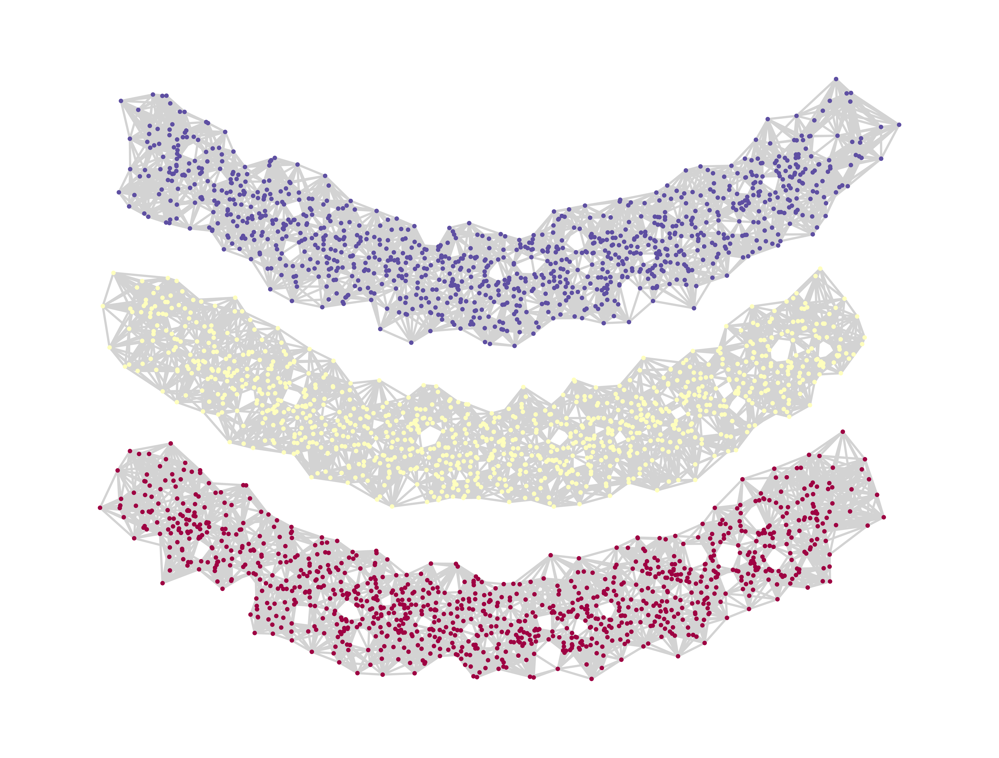

In [71]:
plot_graph_2D(return_dict['data'], orcmanl.G_pruned, node_color=return_dict['cluster'][orcmanl.G_pruned.nodes()], title=None)

In [89]:
# get connected components
connected_components = list(nx.connected_components(orcmanl.G_pruned))
n_cc = len(connected_components)
print(f"Number of connected components: {n_cc}")
# labels
labels = np.arange(len(connected_components))
print(labels)
assignments = np.zeros(len(orcmanl.G_pruned))
for i, cc in enumerate(connected_components):
    assignments[list(cc)] = labels[i]
print(assignments)

# for each cluster get hausdorff distance
hausdorff_matrix = np.zeros((n_cc, n_cc))
for i in range(n_cc):
    for j in range(n_cc):
        if i != j:
            cluster_i = return_dict['data'][assignments == i]
            cluster_j = return_dict['data'][assignments == j]
            h_ij = directed_hausdorff(cluster_i, cluster_j)[0]
            h_ji = directed_hausdorff(cluster_j, cluster_i)[0]
            print(f"Cluster {i} vs Cluster {j}: {h_ij} vs {h_ji}")
            hausdorff_matrix[i, j] = max(h_ij, h_ji) # undirected
print(hausdorff_matrix)

Number of connected components: 3
[0 1 2]
[0. 0. 1. ... 0. 0. 2.]
Cluster 0 vs Cluster 1: 1.097610894271506 vs 0.9969580073221332
Cluster 0 vs Cluster 2: 2.035326299462617 vs 1.9721082362278135
Cluster 1 vs Cluster 0: 0.9969580073221332 vs 1.097610894271506
Cluster 1 vs Cluster 2: 1.0325661180455703 vs 1.0273049490758224
Cluster 2 vs Cluster 0: 1.9721082362278135 vs 2.035326299462617
Cluster 2 vs Cluster 1: 1.0273049490758224 vs 1.0325661180455703
[[0.         1.09761089 2.0353263 ]
 [1.09761089 0.         1.03256612]
 [2.0353263  1.03256612 0.        ]]


In [7]:
%autoreload 2
import gc
torch.cuda.empty_cache()
gc.collect()

isorc = ISORC(orcmanl, dim=2, init='spectral')
X_opt, losses = isorc.fit_graph(lr=0.2, n_iter=500)

Max non-shortcut distance: 7.438916427906455
Scaling by repulsion scale: 10.0


100%|██████████| 500/500 [00:27<00:00, 18.28it/s, loss=46, loss_geo=46.2, loss_spread=-248]  


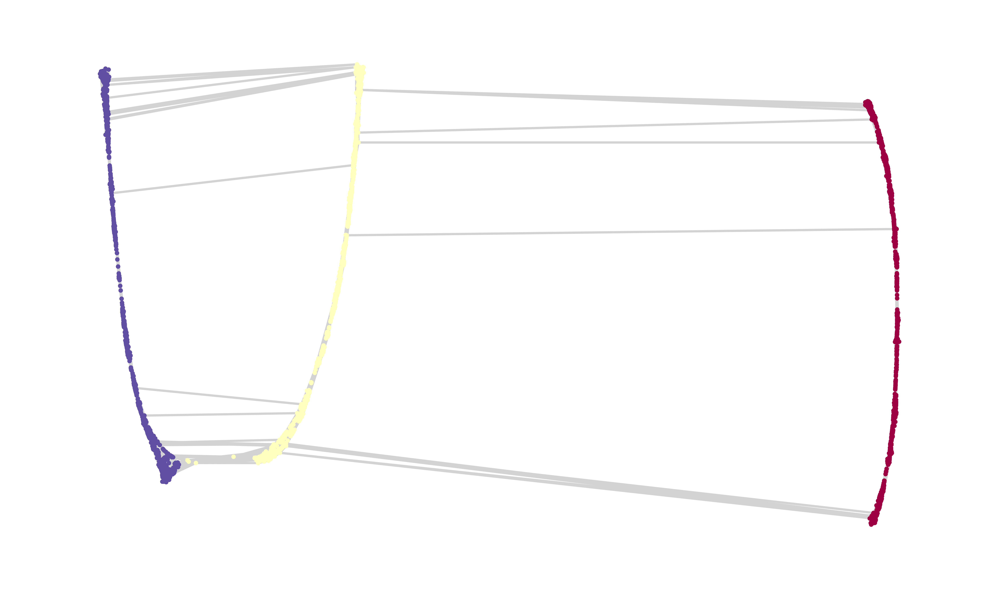

In [8]:
%autoreload 2
plot_graph_2D(X_opt, orcmanl.G, title=None, node_color=return_dict['cluster'][orcmanl.G.nodes()])